In [40]:
import h5py
import scipy.io as io
import PIL.Image as Image
import numpy as np
import os
import glob
from matplotlib import pyplot as plt
from scipy.ndimage.filters import gaussian_filter 
import torchvision.transforms.functional as F
import scipy
import json
from matplotlib import cm as CM
from image import *
from model import CSRNet
import torch
%matplotlib inline

In [41]:

def gaussian_filter_density(gt):
    print (gt.shape)
    density = np.zeros(gt.shape, dtype=np.float32)
    gt_count = np.count_nonzero(gt)
    if gt_count == 0:
        return density

    pts = np.array(list(zip(np.nonzero(gt)[1], np.nonzero(gt)[0])))
    leafsize = 2048
    # build kdtree
    tree = scipy.spatial.KDTree(pts.copy(), leafsize=leafsize)
    # query kdtree
    distances, locations = tree.query(pts, k=4)

    print ('generate density...')
    for i, pt in enumerate(pts):
        pt2d = np.zeros(gt.shape, dtype=np.float32)
        pt2d[pt[1],pt[0]] = 1.
        if gt_count > 1:
            sigma = (distances[i][1]+distances[i][2]+distances[i][3])*0.1
        else:
            sigma = np.average(np.array(gt.shape))/2./2. #case: 1 point
        density += scipy.ndimage.filters.gaussian_filter(pt2d, sigma, mode='constant')
    print ('done.')
    return density

In [43]:
#now generate ground truth
part_A_train = os.path.join('..../images')


In [44]:
img_paths = []
for path in path_sets:
    for img_path in glob.glob(os.path.join(path, '*.jpg')):
        img_paths.append(img_path)

In [45]:
import scipy.spatial
for img_path in img_paths:
    print (img_path)
    mat = io.loadmat(img_path.replace('.jpg','.mat').replace('images','ground-truth'))#.replace('IMG_','GT_IMG_'))
    img= plt.imread(img_path)
    k = np.zeros((img.shape[0],img.shape[1]))
    #gt = mat["annPoints"]
    gt = mat["annPoints"]
    for i in range(0,len(gt)):
        if int(gt[i][1])<img.shape[0] and int(gt[i][0])<img.shape[1]:
            k[int(gt[i][1]),int(gt[i][0])]=1
    k = gaussian_filter_density(k)
    with h5py.File(img_path.replace('.jpg','.h5').replace('images','ground-truth'), 'w') as hf:
            hf['density'] = k
    
    fig = plt.figure()
    gt_file = h5py.File(img_path.replace('.jpg','.h5').replace('images','ground-truth'),'r')
    groundtruth = np.asarray(gt_file['density'])
    ax = fig.add_subplot(111)
    
    plt.imshow(groundtruth,cmap=CM.jet)
 
    plt.savefig(img_path + '_GT.png')

./UCF_CC_50_resize/images\1.jpg
(768, 1024)
generate density...


KeyboardInterrupt: 

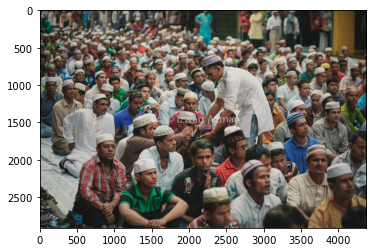

In [35]:
#now see a sample from ShanghaiA
plt.imshow(Image.open(img_paths[2]))

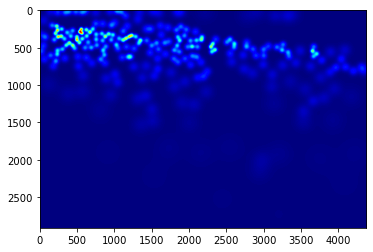

In [36]:
gt_file = h5py.File(img_paths[2].replace('.jpg','.h5').replace('images','ground-truth'),'r')
groundtruth = np.asarray(gt_file['density'])
plt.imshow(groundtruth,cmap=CM.jet)

In [37]:
np.sum(groundtruth)# don't mind this slight variation

236.49854

In [109]:
#now generate ground truth
path_sets = os.path.join('.../images')


In [110]:
img_paths = []
for path in path_sets:
    for img_path in glob.glob(os.path.join(path, '*.jpg')):
        img_paths.append(img_path)
        print (img_path)

C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1396.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1397.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1398.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1399.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1400.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1401.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1402.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1403.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1404.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1405.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1406.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1407.jpg
C:/Users/newla/Desktop/crowd counting/FS

C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1396.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1397.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1398.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1399.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1400.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1401.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1402.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1403.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1404.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1405.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1406.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1407.jpg
C:/Users/newla/Desktop/crowd counting/FS

<ipython-input-111-4f5e9e89636a>:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1417.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1418.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1419.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1420.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1421.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1422.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1423.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1424.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1425.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1426.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1427.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1428.jpg
C:/Users/newla/Desktop/crowd counting/FS

C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1520.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1521.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1522.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1523.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1524.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1525.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1526.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1527.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1528.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1529.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1530.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1531.jpg
C:/Users/newla/Desktop/crowd counting/FS

C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1623.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1624.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1625.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1626.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1627.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1628.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1629.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1630.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1631.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1632.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1633.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1634.jpg
C:/Users/newla/Desktop/crowd counting/FS

C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1726.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1727.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1728.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1729.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1730.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1731.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1732.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1733.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1734.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1735.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1736.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1737.jpg
C:/Users/newla/Desktop/crowd counting/FS

C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1829.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1830.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1831.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1832.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1833.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1834.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1835.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1836.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1837.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1838.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1839.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1840.jpg
C:/Users/newla/Desktop/crowd counting/FS

C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1932.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1933.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1934.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1935.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1936.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1937.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1938.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1939.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1940.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1941.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1942.jpg
C:/Users/newla/Desktop/crowd counting/FSC/added/NPWU/train/test/images\1943.jpg
C:/Users/newla/Desktop/crowd counting/FS

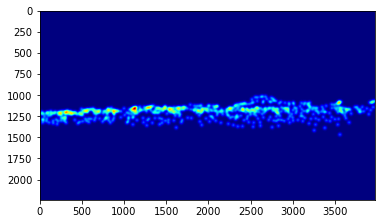

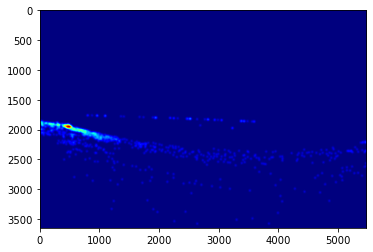

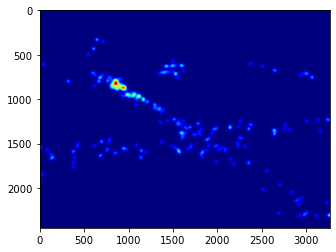

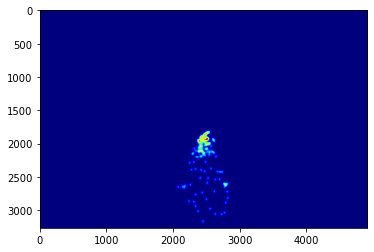

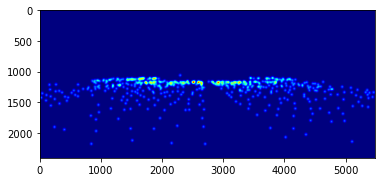

...

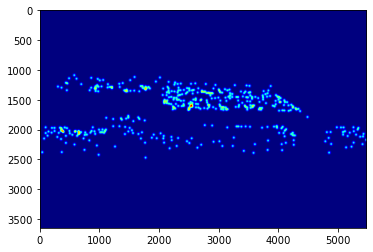

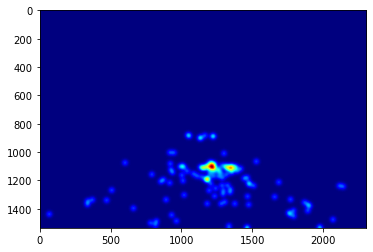

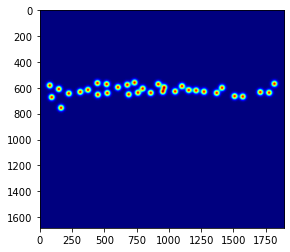

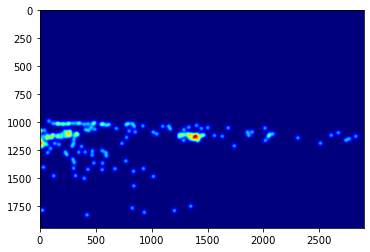

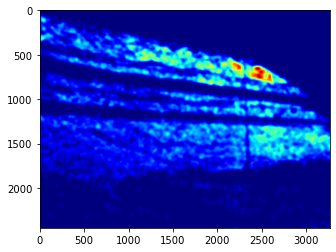

In [111]:
for img_path in img_paths:
    print (img_path)
    mat = io.loadmat(img_path.replace('.jpg','.mat').replace('images','ground-truth'))#.replace('',''))
    img= plt.imread(img_path)
    k = np.zeros((img.shape[0],img.shape[1]))
    gt = mat["annPoints"]
    for i in range(0,len(gt)):
        if int(gt[i][1])<img.shape[0] and int(gt[i][0])<img.shape[1]:
            k[int(gt[i][1]),int(gt[i][0])]=1
    k = gaussian_filter(k,15)
    with h5py.File(img_path.replace('.jpg','.h5').replace('images','ground-truth'), 'w') as hf:
            hf['density'] = k
    fig = plt.figure()
    gt_file = h5py.File(img_path.replace('.jpg','.h5').replace('images','ground-truth'),'r')
    groundtruth = np.asarray(gt_file['density'])
    ax = fig.add_subplot(111)
    
    plt.imshow(groundtruth,cmap=CM.jet)
 
    plt.savefig(img_path + '_GT.png')